In [1]:
%matplotlib inline
import seaborn
import numpy, scipy
import matplotlib.pyplot as plt
import sklearn, pandas
import librosa, librosa.display
import urllib, IPython.display, os.path
plt.rcParams['figure.figsize'] = (14, 5)

[&larr; Back to Index](index.html)

# Genre Recognition

## Step 1: Retrieve Audio

Download an audio file onto your local machine.

In [2]:
filename_brahms = 'brahms_hungarian_dance_5.mp3'
url = "http://audio.musicinformationretrieval.com/" + filename_brahms
if not os.path.exists(filename_brahms):
    urllib.urlretrieve(url, filename=filename_brahms)

Load 120 seconds of an audio file:

In [3]:
x_brahms, fs_brahms = librosa.load(filename_brahms, duration=120)

Play the audio file:

In [4]:
IPython.display.Audio(x_brahms, rate=fs_brahms)

Plot the time-domain waveform of the audio signal:

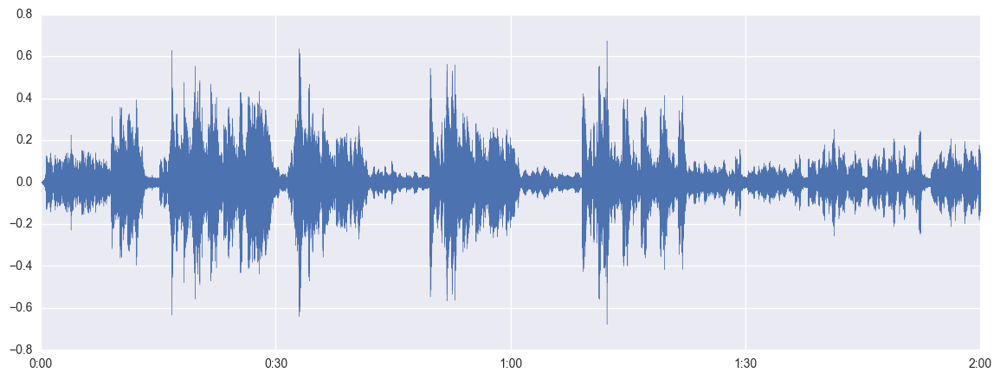

In [5]:
librosa.display.waveplot(x_brahms, fs_brahms)

In [6]:
# See http://musicinformationretrieval.com/stft.html for more details on displaying spectrograms.
S_brahms = librosa.feature.melspectrogram(x_brahms, fs_brahms)

In [7]:
S_log_brahms = librosa.logamplitude(S_brahms)

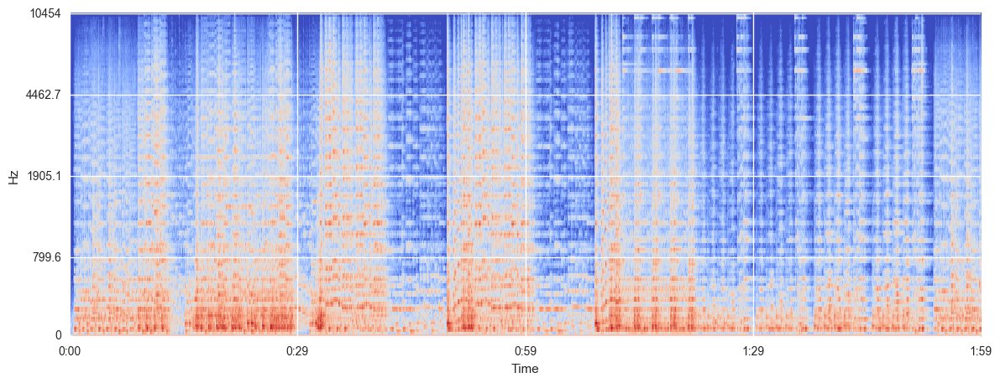

In [8]:
librosa.display.specshow(S_log_brahms, fs_brahms, x_axis='time', y_axis='mel')

## Step 2: Extract Features

For each segment, compute the MFCCs. Experiment with `n_mfcc` to select a different number of coefficients, e.g. 12.

In [9]:
n_mfcc = 12
mfcc_brahms = librosa.feature.mfcc(x_brahms, sr=fs_brahms, n_mfcc=n_mfcc).T

We transpose the result to accommodate scikit-learn which assumes that each row is one observation, and each column is one feature dimension:

In [10]:
mfcc_brahms.shape

(5168, 12)

Scale the features to have zero mean and unit variance:

In [11]:
scaler = sklearn.preprocessing.StandardScaler()

In [12]:
mfcc_brahms_scaled = scaler.fit_transform(mfcc_brahms)

Verify that the scaling worked:

In [13]:
mfcc_brahms_scaled.mean(axis=0)

array([  2.63978725e-16,  -1.64986703e-16,  -4.39964542e-17,
        -2.30981385e-16,   0.00000000e+00,   3.40972520e-16,
         0.00000000e+00,  -1.09991136e-17,   6.59946813e-17,
        -5.49955678e-17,  -7.14942381e-17,   2.19982271e-17])

In [14]:
mfcc_brahms_scaled.std(axis=0)

array([ 1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.])

### Step 2b: Repeat steps 1 and 2 for another audio file.

In [15]:
filename_busta = 'busta_rhymes_hits_for_days.mp3'
url = "http://audio.musicinformationretrieval.com/" + filename_busta
if not os.path.exists(filename_busta):
    urllib.urlretrieve(url, filename=filename_busta)

Load 120 seconds of an audio file:

In [16]:
x_busta, fs_busta = librosa.load(filename_busta, duration=120)

Listen to the second audio file.

In [17]:
IPython.display.Audio(x_busta, rate=fs_busta)

Plot the time-domain waveform and spectrogram of the second audio file. In what ways does the time-domain waveform look different than the first audio file? What differences in musical attributes might this reflect? What additional insights are gained from plotting the spectrogram?

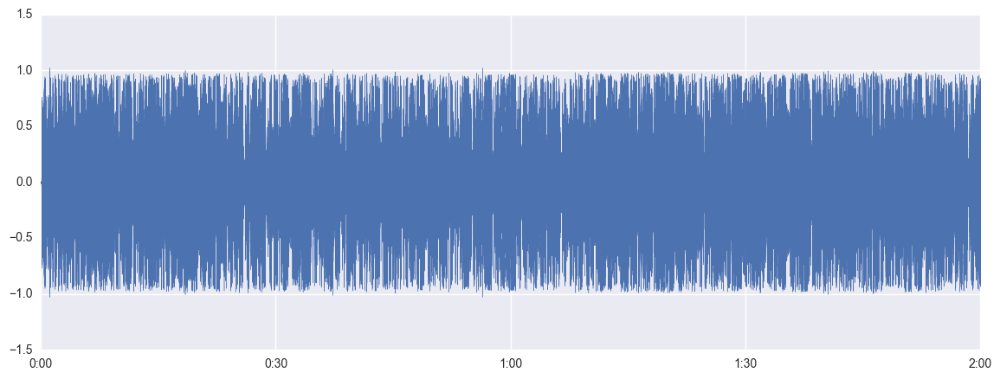

In [18]:
librosa.display.waveplot(x_busta, fs_busta)

In [19]:
# See http://musicinformationretrieval.com/stft.html for more details on displaying spectrograms.
S_busta = librosa.feature.melspectrogram(x_busta, fs_busta)

In [20]:
S_log_busta = librosa.logamplitude(S_busta)

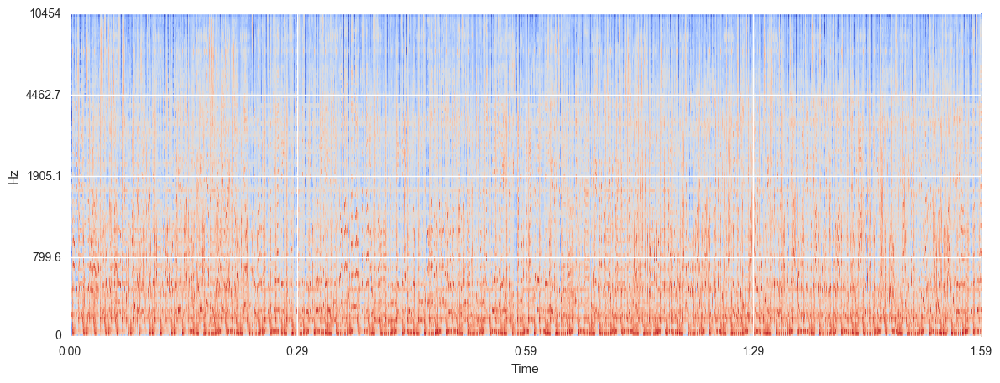

In [21]:
librosa.display.specshow(S_log_busta, fs_busta, x_axis='time', y_axis='mel')

Extract MFCCs from the second audio file.

In [22]:
mfcc_busta = librosa.feature.mfcc(x_busta, sr=fs_busta, n_mfcc=n_mfcc).T

We transpose the resulting matrix so that each row is one observation, i.e. one set of MFCCs. Note that the shape and size of the resulting MFCC matrix is equivalent to that for the first audio file.

In [23]:
mfcc_busta.shape

(5168, 12)

Scale the resulting MFCC features to have approximately zero mean and unit variance. Re-use the scaler from above.

In [24]:
mfcc_busta_scaled = scaler.transform(mfcc_busta)

Verify that the mean of the MFCCs for the second audio file is approximately equal to zero and the variance is approximately equal to one.

In [25]:
mfcc_busta_scaled.mean(axis=0)

array([ 2.31417492, -1.15603795, -0.11005966, -2.082388  , -0.40682724,
       -0.90266115,  0.71710691, -0.11031182, -0.12400772,  0.44565888,
       -0.11609446,  0.82711144])

In [26]:
mfcc_busta_scaled.std(axis=0)

array([ 0.48753416,  0.9861575 ,  1.30296372,  1.65855267,  1.38497461,
        1.72063134,  1.47047551,  1.54027127,  1.16897586,  1.2883977 ,
        1.46671742,  1.22819278])

## Step 3: Train a Classifier

Concatenate all of the scaled feature vectors into one feature table.

In [27]:
features = numpy.vstack((mfcc_brahms_scaled, mfcc_busta_scaled))

In [28]:
features.shape

(10336, 12)

Construct a vector of ground-truth labels, where 0 refers to the first audio file, and 1 refers to the second audio file.

In [29]:
labels = numpy.concatenate((numpy.zeros(len(mfcc_brahms_scaled)), numpy.ones(len(mfcc_busta_scaled))))

Create a classifer model object:

In [30]:
# Support Vector Machine
model = sklearn.svm.SVC()

Train the classifier:

In [31]:
model.fit(features, labels)

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape=None, degree=3, gamma='auto', kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)

## Step 4: Run the Classifier

To test the classifier, we will extract an unused 10-second segment from the earlier audio fields as test excerpts:

In [32]:
x_brahms_test, fs_brahms = librosa.load(filename_brahms, duration=10, offset=120)

In [33]:
x_busta_test, fs_busta = librosa.load(filename_busta, duration=10, offset=120)

Listen to both of the test audio excerpts:

In [34]:
IPython.display.Audio(x_brahms_test, rate=fs_brahms)

In [35]:
IPython.display.Audio(x_busta_test, rate=fs_busta)

Compute MFCCs from both of the test audio excerpts:

In [36]:
mfcc_brahms_test = librosa.feature.mfcc(x_brahms_test, sr=fs_brahms, n_mfcc=n_mfcc).T

In [37]:
mfcc_brahms_test.shape

(431, 12)

In [38]:
mfcc_busta_test = librosa.feature.mfcc(x_busta_test, sr=fs_busta, n_mfcc=n_mfcc).T

In [39]:
mfcc_busta_test.shape

(431, 12)

Scale the MFCCs using the previous scaler:

In [40]:
mfcc_brahms_test_scaled = scaler.transform(mfcc_brahms_test)

In [41]:
mfcc_busta_test_scaled = scaler.transform(mfcc_busta_test)

Concatenate all test features together:

In [42]:
features_test = numpy.vstack((mfcc_brahms_test_scaled, mfcc_busta_test_scaled))

Concatenate all test labels together:

In [43]:
labels_test = numpy.concatenate((numpy.zeros(len(mfcc_brahms_test)), numpy.ones(len(mfcc_busta_test))))

Compute the predicted labels:

In [44]:
predicted_labels = model.predict(features_test)

Finally, compute the accuracy score of the classifier on the test data:

In [45]:
score = model.score(features_test, labels_test)

In [46]:
score

0.99767981438515085

Currently, the classifier returns one prediction for every MFCC vector in the test audio signal. Let's modify the procedure above such that the classifier returns a single prediction for a 10-second excerpt.

In [47]:
predicted_labels = model.predict(mfcc_brahms_test_scaled)

In [48]:
numpy.argmax([(predicted_labels == c).sum() for c in (0, 1)])

0

In [49]:
predicted_labels = model.predict(mfcc_busta_test_scaled)

In [50]:
numpy.argmax([(predicted_labels == c).sum() for c in (0, 1)])

1

## Step 5: Analysis in Pandas

Read the MFCC features from the first test audio excerpt into a data frame:

In [51]:
df_brahms = pandas.DataFrame(mfcc_brahms_test_scaled)

In [52]:
df_brahms.shape

(431, 12)

In [53]:
df_brahms.head()

,0,1,2,3,4,5,6,7,8,9,10,11
0,0.142527,0.587337,-0.665408,0.755152,-0.125772,0.260300,0.297659,-0.700702,0.937015,-1.307266,0.059189,0.575994
1,0.104445,0.766864,-0.689003,1.162901,-0.324828,-0.445923,-0.421134,-1.050676,0.678715,-0.750682,0.076883,0.466231
2,0.054057,0.743579,-0.678934,1.293745,-0.352918,-0.798432,-0.556204,-0.855628,0.873113,-0.010282,-0.051093,0.361900
3,0.025481,0.616521,-0.928790,1.299730,-0.336910,-1.032563,-0.693672,-1.025840,0.932904,0.378407,0.400650,0.196996
4,-0.000612,0.430802,-1.080589,0.870045,-0.655860,-0.871656,-0.841300,-1.288227,1.208906,0.205005,0.042555,0.073379


In [54]:
df_busta = pandas.DataFrame(mfcc_busta_test_scaled)

Compute the pairwise correlation of every pair of 12 MFCCs against one another for both test audio excerpts. For each audio excerpt, which pair of MFCCs are the most correlated? least correlated?

In [55]:
df_brahms.corr()

,0,1,2,3,4,5,6,7,8,9,10,11
0,1.000000,-0.607339,-0.159610,0.114869,-0.505445,0.702529,-0.362894,0.614428,-0.229737,0.693735,-0.066741,0.069389
1,-0.607339,1.000000,0.117183,0.237589,0.475178,-0.280797,0.391226,-0.326421,0.313324,-0.269880,0.148326,-0.357110
2,-0.159610,0.117183,1.000000,-0.032423,0.384977,0.036473,0.027133,-0.028185,-0.031116,-0.094253,-0.070135,-0.024263
3,0.114869,0.237589,-0.032423,1.000000,0.070962,0.276879,0.136198,0.253943,0.395073,0.358765,-0.021200,-0.179880
4,-0.505445,0.475178,0.384977,0.070962,1.000000,-0.105042,0.361069,-0.253696,0.141891,-0.251774,0.116845,-0.228414
5,0.702529,-0.280797,0.036473,0.276879,-0.105042,1.000000,0.018718,0.556819,-0.167866,0.560639,-0.179268,-0.032929
6,-0.362894,0.391226,0.027133,0.136198,0.361069,0.018718,1.000000,0.166027,0.190792,-0.192884,-0.045048,-0.123654
7,0.614428,-0.326421,-0.028185,0.253943,-0.253696,0.556819,0.166027,1.000000,0.180418,0.589211,-0.099785,-0.097866
8,-0.229737,0.313324,-0.031116,0.395073,0.141891,-0.167866,0.190792,0.180418,1.000000,0.182628,-0.028015,-0.255389
9,0.693735,-0.269880,-0.094253,0.358765,-0.251774,0.560639,-0.192884,0.589211,0.182628,1.000000,0.166221,-0.236277


In [56]:
df_busta.corr()

,0,1,2,3,4,5,6,7,8,9,10,11
0,1.000000,-0.189510,-0.226817,-0.209900,-0.237802,-0.062474,0.000639,0.097341,0.192270,-0.109252,-0.070764,-0.002800
1,-0.189510,1.000000,-0.186848,0.040759,0.167293,0.043366,-0.030735,0.193962,-0.017278,0.145164,0.065664,0.195953
2,-0.226817,-0.186848,1.000000,-0.032032,0.265536,0.113541,0.115781,0.159951,0.079121,0.275651,0.229744,0.171050
3,-0.209900,0.040759,-0.032032,1.000000,0.292563,0.003416,0.003770,0.202867,0.196849,0.003049,-0.108829,0.220918
4,-0.237802,0.167293,0.265536,0.292563,1.000000,0.140759,0.093848,0.273909,0.206646,0.283043,0.097520,0.281974
5,-0.062474,0.043366,0.113541,0.003416,0.140759,1.000000,0.303171,0.179193,0.199188,0.363420,0.469618,0.170335
6,0.000639,-0.030735,0.115781,0.003770,0.093848,0.303171,1.000000,0.317448,0.436829,0.167511,0.207785,0.047206
7,0.097341,0.193962,0.159951,0.202867,0.273909,0.179193,0.317448,1.000000,0.318544,0.271781,0.179939,0.391120
8,0.192270,-0.017278,0.079121,0.196849,0.206646,0.199188,0.436829,0.318544,1.000000,0.398028,0.203774,0.265069
9,-0.109252,0.145164,0.275651,0.003049,0.283043,0.363420,0.167511,0.271781,0.398028,1.000000,0.539405,0.467328


Display a scatter plot of any two of the MFCC dimensions (i.e. columns of the data frame) against one another. Try for multiple pairs of MFCC dimensions.

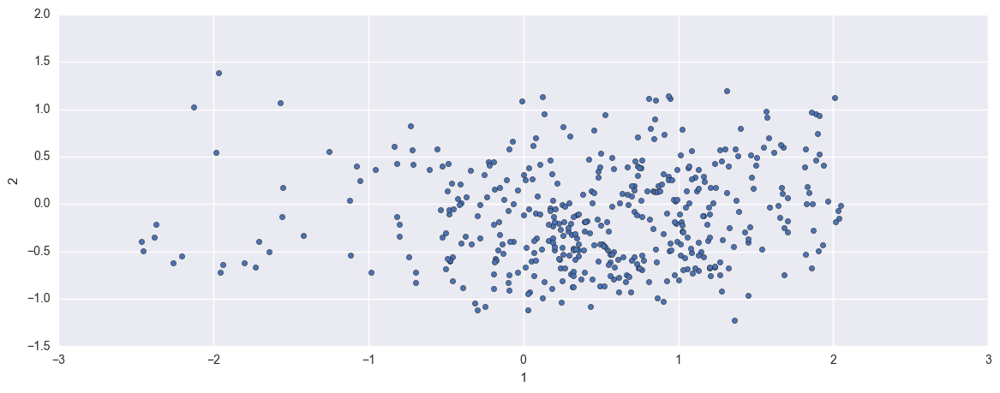

In [57]:
df_brahms.plot.scatter(1, 2)

Display a scatter plot of any two of the MFCC dimensions (i.e. columns of the data frame) against one another. Try for multiple pairs of MFCC dimensions.

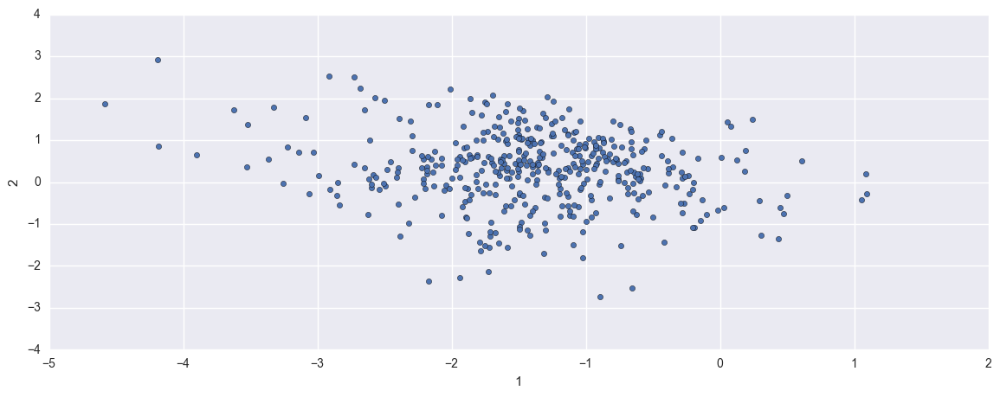

In [58]:
df_busta.plot.scatter(1, 2)

Plot a histogram of all values across a single MFCC, i.e. MFCC coefficient number. Repeat for a few different MFCC numbers:

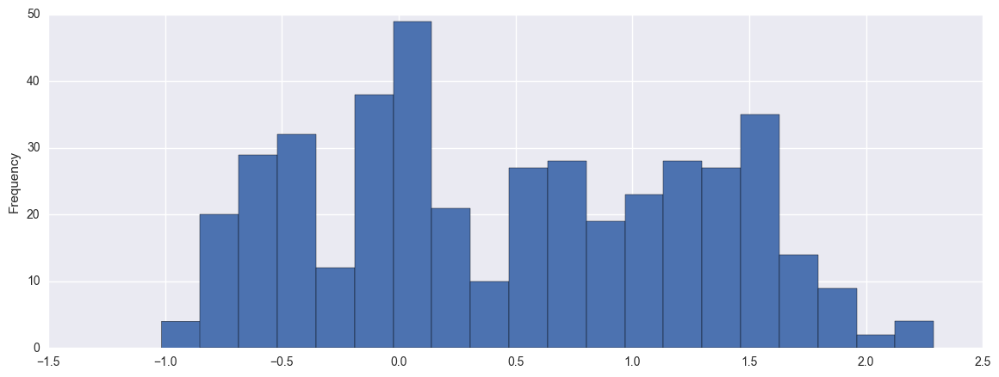

In [59]:
df_brahms[0].plot.hist(bins=20)

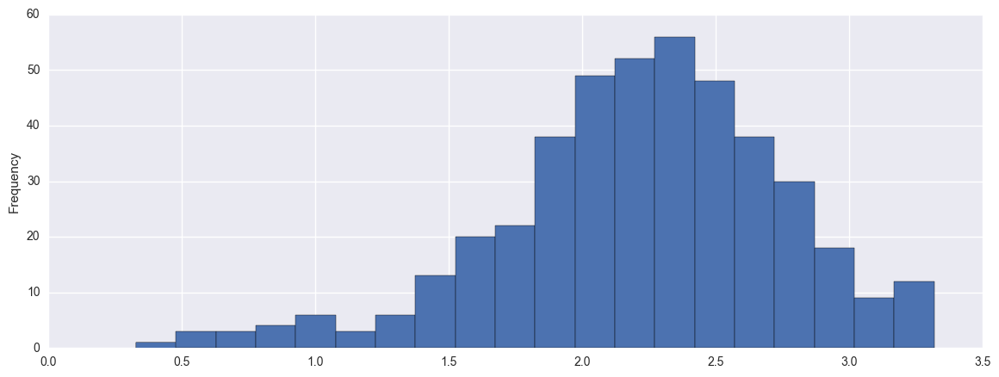

In [60]:
df_busta[0].plot.hist(bins=20)

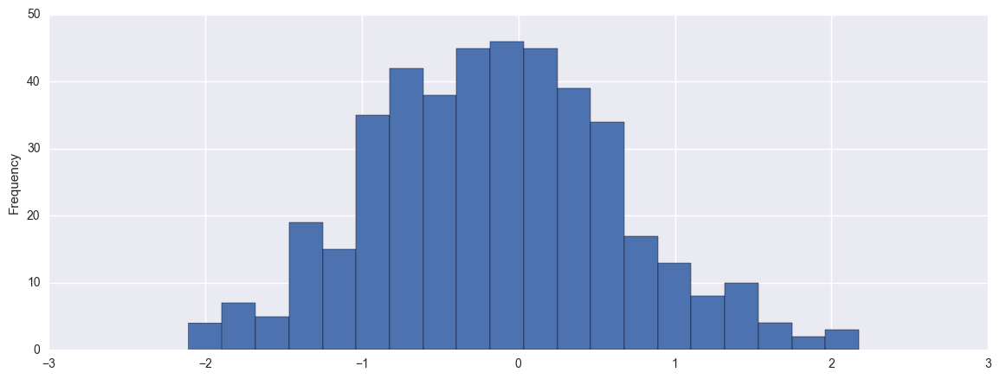

In [61]:
df_brahms[11].plot.hist(bins=20)

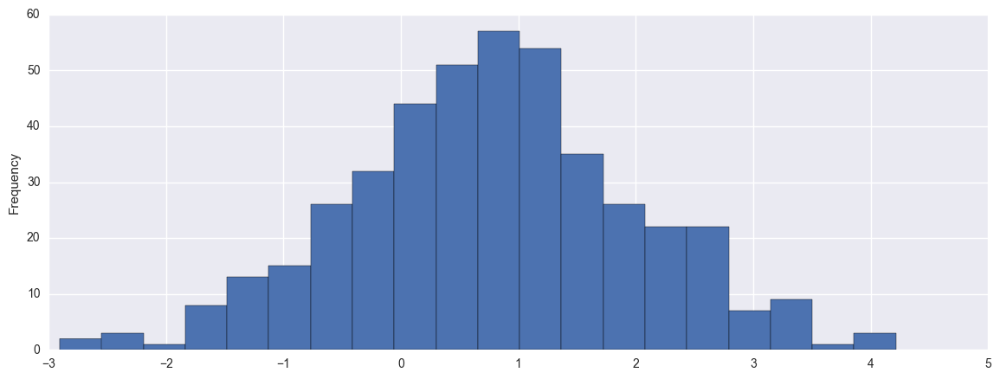

In [62]:
df_busta[11].plot.hist(bins=20)

[&larr; Back to Index](index.html)